In [6]:
import weather
import pandas as pd
import numpy as np 
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, PowerTransformer, LabelEncoder # for standardizing the Data
from sklearn.decomposition import PCA # for PCA calculation

from scipy.stats import yeojohnson

import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.multivariate.manova import MANOVA

### Getting data

In [7]:
historical_weather, condensed = weather.weather_main()

# Apply the function to the 'description' column to create a new column
historical_weather['reduced_description'] = historical_weather['description'].apply(weather.map_weather)

Getting weather data for Seattle
Coordinates 52.5483283996582°N 13.407821655273438°E
Elevation 38.0 m asl
Timezone None None
Timezone difference to GMT+0 0 s
Getting weather codes
Analyzing and weighing weather data


Shape: (3654, 20)
date                       datetime64[ns, UTC]
description                             object
season                                  object
weather_score_weighted                 float64
weight                                 float32
weather_score                            int32
weather_code                             int32
temperature_2m_mean                    float32
temperature_2m_min                     float32
temperature_2m_max                     float32
precipitation_sum                      float32
rain_sum                               float32
snowfall_sum                           float32
daylight_duration                      float32
sunshine_duration                      float32
precipitation_hours                    float32
wind_speed_10m_max                     float32
wind_gusts_10m_max                     float32
shortwave_radiation_sum                float32
reduced_description                     object
dtype: object
date                       0

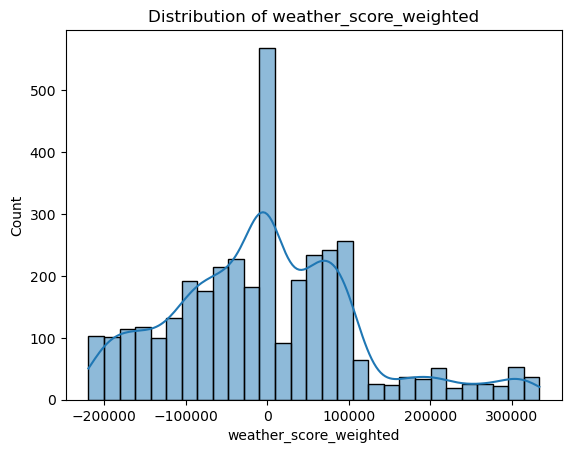

C:\Users\graha\AppData\Local\Temp\ipykernel_24416\131137254.py:29: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(historical_weather.corr(), annot=True, cmap='coolwarm')


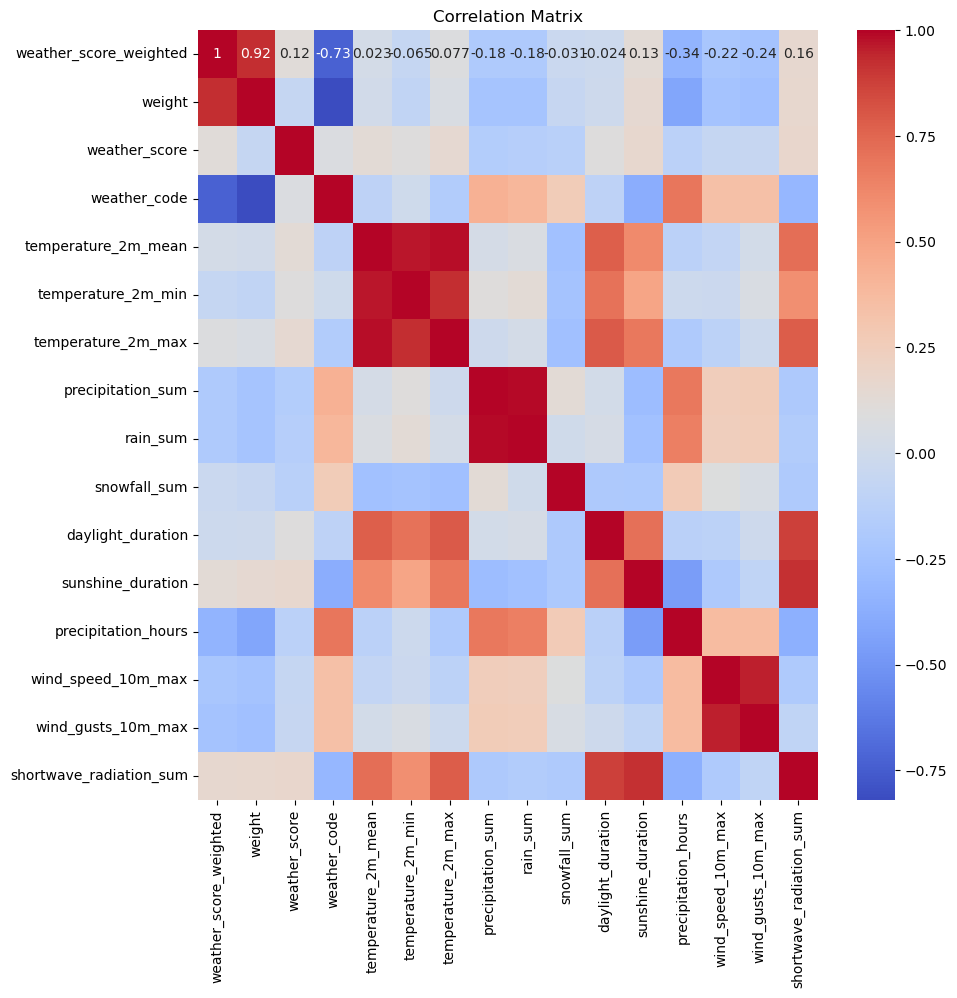

In [ ]:

# 1. Check the first few rows of the DataFrame
# print(historical_weather.head())

# 2. Check the shape of the DataFrame
print('Shape:', historical_weather.shape)

# 3. Check the data types of the columns
print(historical_weather.dtypes)

# 4. Check for missing values
print(historical_weather.isnull().sum())

# 5. Get summary statistics for numerical columns
print(historical_weather.describe())

# 6. Get unique values for categorical columns
for col in historical_weather.select_dtypes(include=['object']).columns:
    print(f"{col}: {historical_weather[col].unique()}")

# 7. Visualize the distributions of numerical columns
for col in historical_weather.select_dtypes(include=['float64', 'int64']).columns:
    plt.figure()
    sns.histplot(historical_weather[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

# 8. Visualize the correlations between numerical columns
plt.figure(figsize=(10, 10))
sns.heatmap(historical_weather.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

### Data summary

In [ ]:
historical_weather.head()

,date,description,season,weather_score_weighted,weight,weather_score,weather_code,temperature_2m_mean,temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,snowfall_sum,daylight_duration,sunshine_duration,precipitation_hours,wind_speed_10m_max,wind_gusts_10m_max,shortwave_radiation_sum,reduced_description
1633,2022-06-22 00:00:00+00:00,Mainly Sunny,summer,333762.257812,111254.085938,2,1,68.810303,52.895302,80.165298,0.0,0.0,0.0,60611.683594,55577.957031,0.0,9.865652,16.7775,29.360001,Sun
904,2020-06-23 00:00:00+00:00,Mainly Sunny,summer,333754.640625,111251.546875,2,1,65.889046,54.875298,74.765305,0.0,0.0,0.0,60601.980469,55578.671875,0.0,10.187565,20.8041,28.309999,Sun
1260,2021-06-14 00:00:00+00:00,Mainly Sunny,summer,332939.343750,110979.781250,2,1,66.792809,49.205299,78.365303,0.0,0.0,0.0,60483.121094,55442.011719,0.0,6.949117,14.5405,28.959999,Sun
540,2019-06-25 00:00:00+00:00,Mainly Sunny,summer,332828.250000,110942.750000,2,1,81.766548,67.655304,92.585297,0.0,0.0,0.0,60572.570312,55416.304688,0.0,12.342079,24.8307,28.379999,Sun
1263,2021-06-17 00:00:00+00:00,Mainly Sunny,summer,332513.390625,110837.796875,2,1,79.962799,65.315300,90.785294,0.0,0.0,0.0,60581.503906,55365.328125,0.0,11.574179,23.0411,27.170000,Sun


In [ ]:
historical_weather['description'].unique()

array(['Mainly Sunny', 'Sunny', 'Cloudy', 'Partly Cloudy', 'Light Snow',
       'Snow', 'Rain', 'Drizzle', 'Light Rain', 'Heavy Drizzle',
       'Heavy Rain', 'Light Drizzle', 'Heavy Snow'], dtype=object)

In [ ]:
historical_weather.shape  # (2312, 19)
historical_weather.select_dtypes(include=[np.number]).columns

Index(['weather_score_weighted', 'weight', 'weather_score', 'weather_code',
       'temperature_2m_mean', 'temperature_2m_min', 'temperature_2m_max',
       'precipitation_sum', 'rain_sum', 'snowfall_sum', 'daylight_duration',
       'sunshine_duration', 'precipitation_hours', 'wind_speed_10m_max',
       'wind_gusts_10m_max', 'shortwave_radiation_sum'],
      dtype='object')

In [ ]:
historical_weather.describe()

,weather_score_weighted,weight,weather_score,weather_code,temperature_2m_mean,temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,snowfall_sum,daylight_duration,sunshine_duration,precipitation_hours,wind_speed_10m_max,wind_gusts_10m_max,shortwave_radiation_sum
count,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000,3654.000000
mean,-2558.081099,2353.600342,0.477559,34.100712,51.622948,44.484127,58.515831,0.065298,0.061788,0.025108,44217.238281,26838.378906,3.706897,11.982301,23.046793,11.083321
std,114082.797281,63893.339844,0.683316,27.361632,13.704494,12.216016,15.471044,0.147468,0.146178,0.136671,11258.491211,17307.347656,4.840252,4.235197,7.875582,7.900558
min,-219468.984375,-109734.492188,-1.000000,0.000000,13.467801,5.195301,19.055300,0.000000,0.000000,0.000000,27516.162109,0.000000,0.000000,3.421952,7.605800,0.260000
25%,-80928.908203,-50161.486328,0.000000,3.000000,40.858738,34.895302,46.055298,0.000000,0.000000,0.000000,33442.058594,11958.726318,0.000000,8.910170,17.448601,3.590000
50%,-205.146484,-175.794922,0.000000,51.000000,51.075197,44.310200,58.052750,0.007874,0.007874,0.000000,44318.531250,27896.458008,2.000000,11.406507,21.922600,9.850000
75%,66179.746094,62709.939453,1.000000,53.000000,62.765217,54.466474,70.715302,0.074803,0.062992,0.000000,55040.140625,42131.053711,6.000000,14.416072,27.291399,17.697501
max,333762.257812,111283.453125,2.000000,75.000000,86.247795,74.765305,99.875298,4.314961,4.314961,2.948818,60622.195312,55586.050781,24.000000,37.382004,69.123299,29.360001


In [ ]:
mean_daylight_duration = historical_weather['daylight_duration'].mean()
mean_sunshine_duration = historical_weather['sunshine_duration'].mean()

result = mean_sunshine_duration / mean_daylight_duration 
1 - result

0.39303356409072876

In [ ]:
pd.DataFrame(historical_weather.groupby('description')['weather_score_weighted'].mean().sort_values(ascending=False))

,weather_score_weighted
description,
Mainly Sunny,262322.666453
Sunny,173486.825740
Partly Cloudy,86157.212118
Cloudy,54300.270127
Snow,-20487.102327
Light Snow,-39078.820312
Drizzle,-41184.764923
Heavy Snow,-44854.839844
Rain,-48260.907064


In [ ]:
condensed.head()

,description,season,temperature_2m_max,temperature_2m_min,temperature_2m_mean,precipitation_sum,rain_sum,daylight_duration,sunshine_duration,precipitation_hours,wind_speed_10m_max,wind_gusts_10m_max,shortwave_radiation_sum,snowfall_sum,weather_score,weight,weather_score_weighted
30,Mainly Sunny,summer,85.580879,60.680302,74.422249,0.0,0.0,57286.621094,51862.964844,0.0,10.520115,20.709459,25.116537,0.0,2,103825.468750,311476.406250
29,Mainly Sunny,spring,65.830551,42.855801,54.685741,0.0,0.0,51173.433594,46034.617188,0.0,10.934191,20.490919,21.232000,0.0,2,92145.156250,276435.468750
28,Mainly Sunny,fall,69.926071,49.325302,59.160976,0.0,0.0,41255.093750,36028.457031,0.0,8.823088,16.783236,12.468461,0.0,2,72128.546875,216385.640625
45,Sunny,summer,84.446724,58.186012,72.923782,0.0,0.0,57568.179688,52547.812500,0.0,9.321014,19.429943,26.628571,0.0,1,105195.179688,210390.359375
31,Mainly Sunny,winter,53.424049,32.510300,41.790848,0.0,0.0,39164.003906,34380.382812,0.0,7.892925,14.484575,11.272500,0.0,2,68813.828125,206441.484375


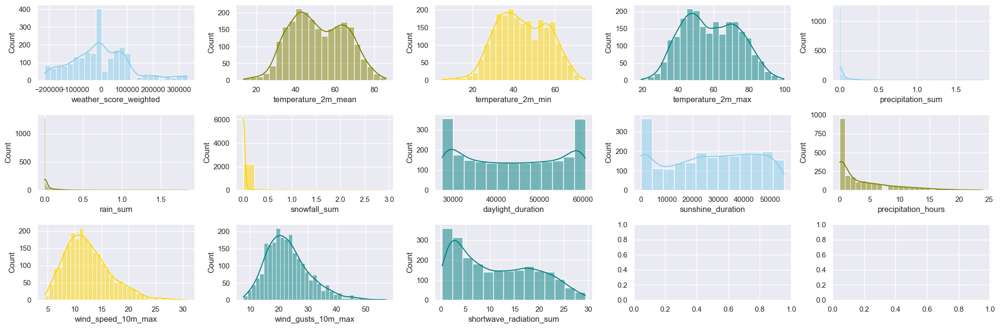

In [ ]:
sns.set_theme(style="darkgrid")
df = sns.load_dataset("iris")

fig, axs = plt.subplots(3, 5, figsize=(21, 7))

sns.histplot(data=historical_weather, x="weather_score_weighted", kde=True, color="skyblue", ax=axs[0, 0])
sns.histplot(data=historical_weather, x="temperature_2m_mean", kde=True, color="olive", ax=axs[0, 1])
sns.histplot(data=historical_weather, x="temperature_2m_min", kde=True, color="gold", ax=axs[0, 2])
sns.histplot(data=historical_weather, x="temperature_2m_max", kde=True, color="teal", ax=axs[0, 3])
sns.histplot(data=historical_weather, x="precipitation_sum", kde=True, color="skyblue", ax=axs[0, 4])
sns.histplot(data=historical_weather, x="rain_sum", kde=True, color="olive", ax=axs[1, 0])
sns.histplot(data=historical_weather, x="snowfall_sum", kde=True, color="gold", ax=axs[1, 1])
sns.histplot(data=historical_weather, x="daylight_duration", kde=True, color="teal", ax=axs[1, 2])
sns.histplot(data=historical_weather, x="sunshine_duration", kde=True, color="skyblue", ax=axs[1, 3])
sns.histplot(data=historical_weather, x="precipitation_hours", kde=True, color="olive", ax=axs[1, 4])
sns.histplot(data=historical_weather, x="wind_speed_10m_max", kde=True, color="gold", ax=axs[2, 0])
sns.histplot(data=historical_weather, x="wind_gusts_10m_max", kde=True, color="teal", ax=axs[2, 1])
sns.histplot(data=historical_weather, x="shortwave_radiation_sum", kde=True, color="teal", ax=axs[2, 2])

plt.tight_layout()

plt.show()

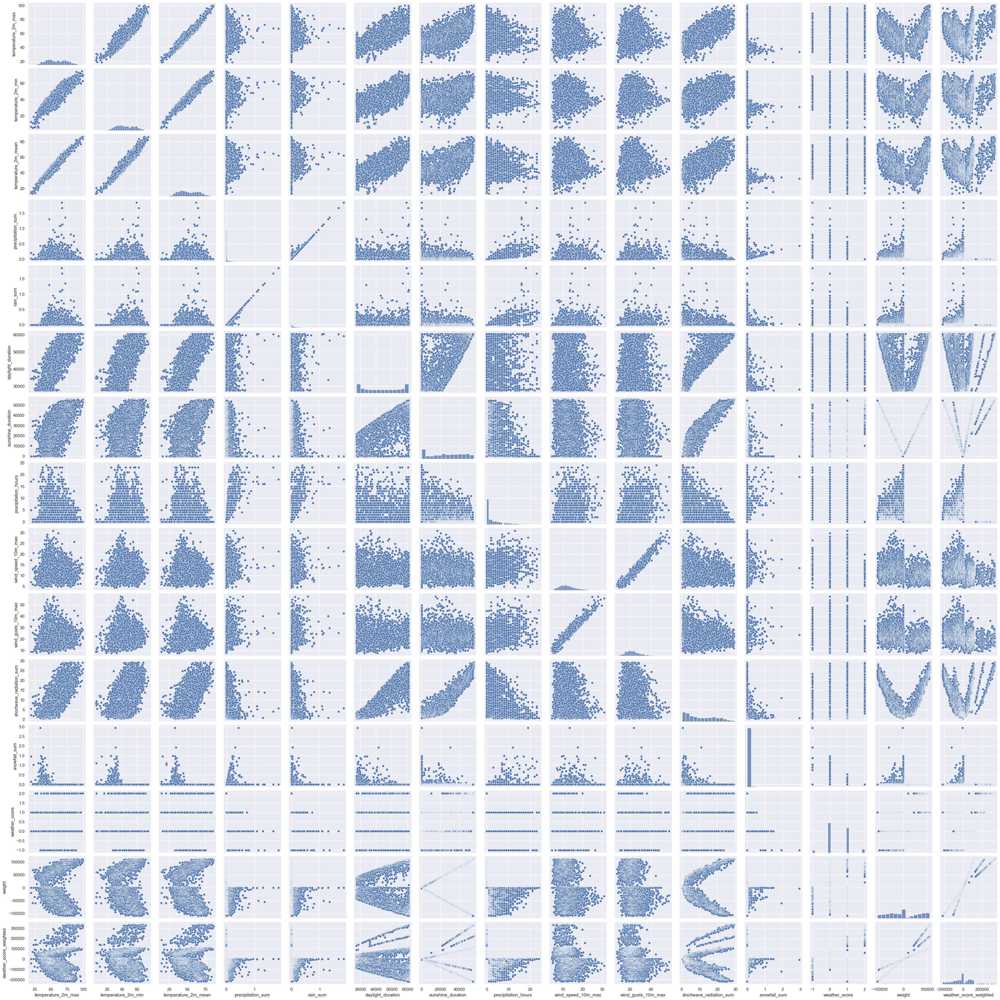

In [ ]:
# Assuming you have loaded the historical_weather dataset into a pandas DataFrame called 'df'
# Replace 'column1', 'column2', etc. with the actual column names from your dataset

sns.pairplot(historical_weather[condensed.columns])


# TODO: NORMALIZING FOR REAL

In [ ]:

# Assuming 'pc_cols' is a list of your principal component column names
pc_cols = historical_weather.select_dtypes(include=[np.number]).columns

# Use join() to concatenate all the elements in 'pc_cols' into a string, separated by '+'
pc_cols_str = ' + '.join(pc_cols)

model = ols(f'weather_score_weighted ~ {pc_cols_str}', data=historical_weather).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
weather_score_weighted,2.984041e+12,1.0,1.617158e+32,0.000000e+00
weight,7.026524e-19,1.0,3.807924e+01,8.006452e-10
weather_score,3.732511e-20,1.0,2.022781e+00,1.550911e-01
weather_code,8.555361e-20,1.0,4.636455e+00,3.140348e-02
temperature_2m_mean,2.808635e-21,1.0,1.522099e-01,6.964686e-01
temperature_2m_min,3.957518e-20,1.0,2.144720e+00,1.431981e-01
temperature_2m_max,1.262711e-20,1.0,6.843079e-01,4.081932e-01
precipitation_sum,1.480391e-22,1.0,8.022769e-03,9.286368e-01
rain_sum,4.111501e-22,1.0,2.228169e-02,8.813533e-01
snowfall_sum,1.543440e-22,1.0,8.364452e-03,9.271372e-01


### Normalizing automated

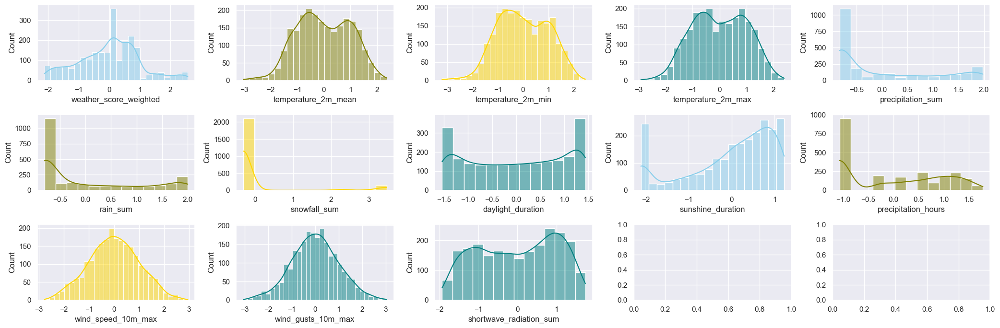

In [ ]:


y = historical_weather['weather_score_weighted']
y,fitted_lambda = yeojohnson(y,lmbda=None)
pt = PowerTransformer(method='yeo-johnson')
data = pt.fit_transform(historical_weather[historical_weather.select_dtypes(include=[np.number]).columns])
data = pd.DataFrame(data, columns=historical_weather.select_dtypes(include=[np.number]).columns)

fig, axs = plt.subplots(3, 5, figsize=(21, 7))

sns.histplot(data=data, x="weather_score_weighted", kde=True, color="skyblue", ax=axs[0, 0])
sns.histplot(data=data, x="temperature_2m_mean", kde=True, color="olive", ax=axs[0, 1])
sns.histplot(data=data, x="temperature_2m_min", kde=True, color="gold", ax=axs[0, 2])
sns.histplot(data=data, x="temperature_2m_max", kde=True, color="teal", ax=axs[0, 3])
sns.histplot(data=data, x="precipitation_sum", kde=True, color="skyblue", ax=axs[0, 4])
sns.histplot(data=data, x="rain_sum", kde=True, color="olive", ax=axs[1, 0])
sns.histplot(data=data, x="snowfall_sum", kde=True, color="gold", ax=axs[1, 1])
sns.histplot(data=data, x="daylight_duration", kde=True, color="teal", ax=axs[1, 2])
sns.histplot(data=data, x="sunshine_duration", kde=True, color="skyblue", ax=axs[1, 3])
sns.histplot(data=data, x="precipitation_hours", kde=True, color="olive", ax=axs[1, 4])
sns.histplot(data=data, x="wind_speed_10m_max", kde=True, color="gold", ax=axs[2, 0])
sns.histplot(data=data, x="wind_gusts_10m_max", kde=True, color="teal", ax=axs[2, 1])
sns.histplot(data=data, x="shortwave_radiation_sum", kde=True, color="teal", ax=axs[2, 2])

plt.tight_layout()
plt.show()

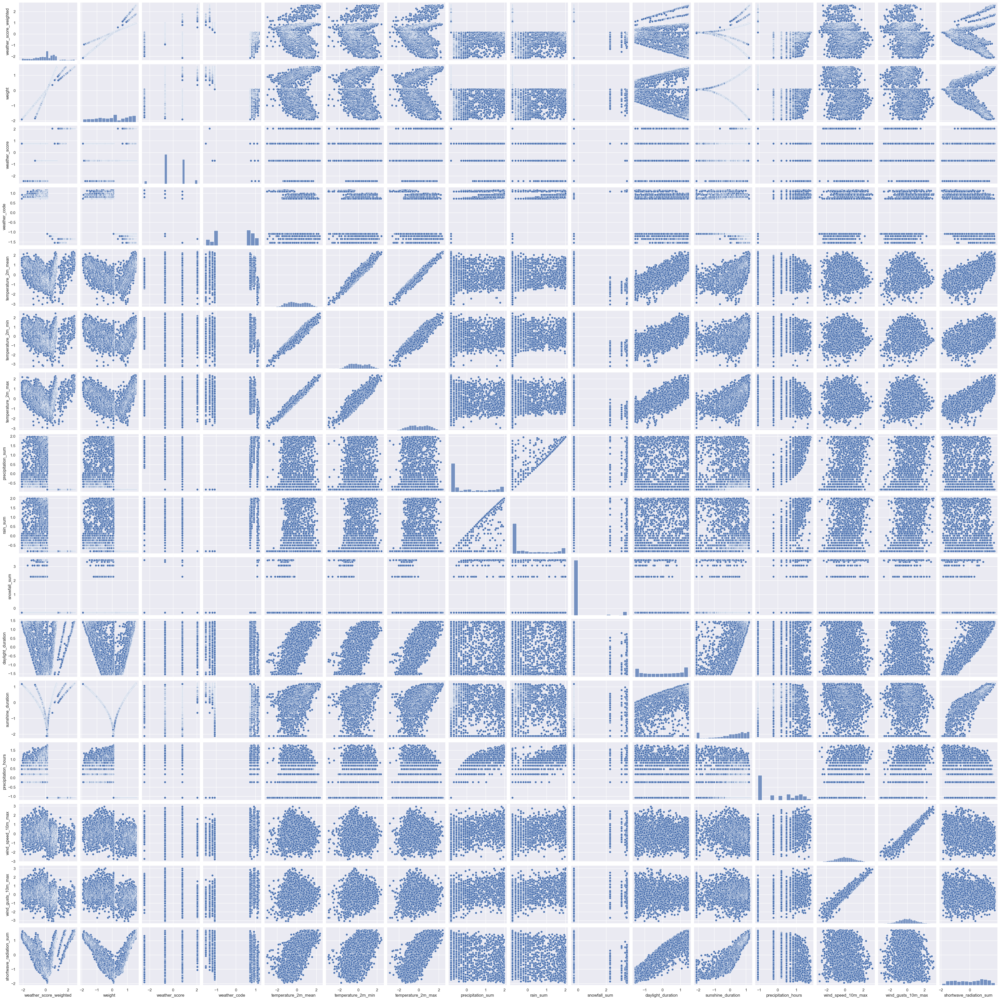

In [ ]:
sns.pairplot(data=data)

# Modeling

Text(0, 0.5, 'cumulative explained variance')

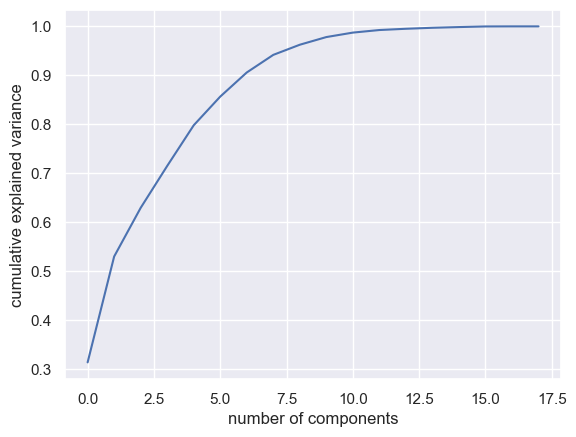

In [ ]:

# Assuming 'weather' is the column with string values
le = LabelEncoder()
historical_weather['description'] = le.fit_transform(historical_weather['description'])
historical_weather['season'] = le.fit_transform(historical_weather['season'])

X = historical_weather.drop(['date'], axis=1).values 

sc = StandardScaler() 
X_std = sc.fit_transform(X) 

pca = PCA()
X_pca = pca.fit_transform(X_std)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

We know we need at least 6 components. Up to 10

In [ ]:
pca2 = PCA(n_components = 7)
X_pca = pca2.fit_transform(X_std) # this will fit and reduce dimensions

# Assuming 'date' is the column you dropped
columns_used_in_pca = historical_weather.drop(['date'], axis=1).columns

n_pcs= pca2.n_components_ # get number of component# get the index of the most important feature on EACH component
most_important = [np.abs(pca2.components_[i]).argmax() for i in range(n_pcs)]

# get the most important feature names
most_important_names = [columns_used_in_pca[most_important[i]] for i in range(n_pcs)]

final_hist = historical_weather[most_important_names]

most_important_names


['shortwave_radiation_sum',
 'temperature_2m_min',
 'weather_score_weighted',
 'description',
 'wind_speed_10m_max',
 'snowfall_sum',
 'season']

In [ ]:
pd.DataFrame(pca2.components_, columns = columns_used_in_pca)[most_important_names]

,shortwave_radiation_sum,temperature_2m_min,weather_score_weighted,description,wind_speed_10m_max,snowfall_sum,season
0,-0.366209,-0.270569,-0.157239,-0.002261,0.167329,0.146768,0.114269
1,0.139956,0.319557,-0.261219,0.123833,0.229944,0.000374,-0.028283
2,-0.009487,0.032827,0.504206,0.148229,-0.004556,0.090626,-0.013804
3,0.052857,-0.069544,0.066679,0.638308,-0.288552,0.275062,0.097398
4,-0.093949,0.104304,-0.209023,-0.251038,-0.570065,-0.099051,-0.159255
5,0.204875,-0.038869,-0.083722,-0.046320,-0.063904,0.658218,0.442765
6,-0.014863,-0.029687,-0.008964,0.082760,0.063736,0.453064,-0.857254


In [ ]:
final_hist.head()

,shortwave_radiation_sum,temperature_2m_min,weather_score_weighted,description,wind_speed_10m_max,snowfall_sum,season
1633,29.360001,52.895302,333762.257812,8,9.865652,0.0,2
904,28.309999,54.875298,333754.640625,8,10.187565,0.0,2
1260,28.959999,49.205299,332939.343750,8,6.949117,0.0,2
540,28.379999,67.655304,332828.250000,8,12.342079,0.0,2
1263,27.170000,65.315300,332513.390625,8,11.574179,0.0,2


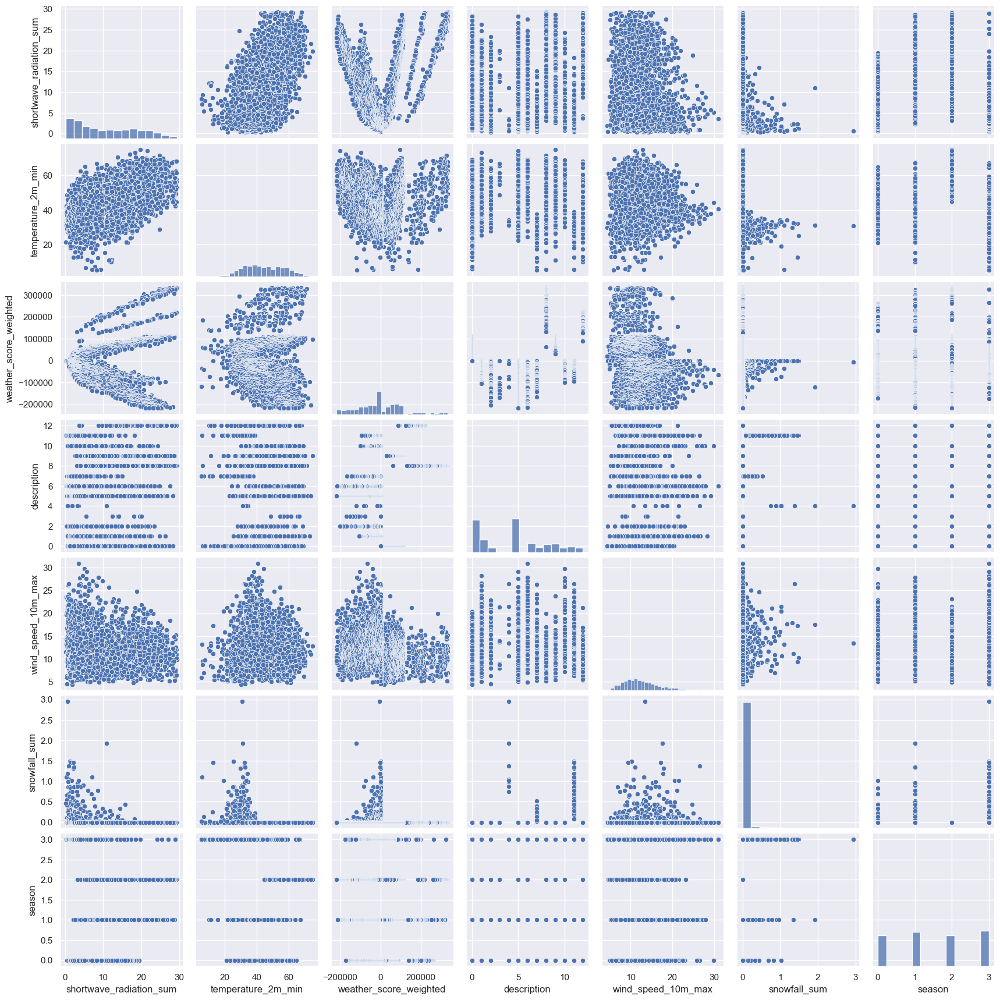

In [ ]:
sns.pairplot(final_hist)

In [ ]:
# Assuming 'final_hist' is a DataFrame with your dependent variables
pca = PCA(n_components=min(final_hist.shape))
final_hist_pca = pca.fit_transform(final_hist)

# Convert the PCA output to a DataFrame
final_hist_pca_df = pd.DataFrame(final_hist_pca, columns=[f'PC{i}' for i in range(1, min(final_hist.shape)+1)])

# Add the independent variable to the DataFrame
final_hist_pca_df['description'] = historical_weather['description'].values

# Assuming 'pc_cols' is a list of your principal component column names
pc_cols = [f'PC{i}' for i in range(1, min(final_hist.shape)+1)]

# Use join() to concatenate all the elements in 'pc_cols' into a string, separated by '+'
pc_cols_str = ' + '.join(pc_cols)

manova = MANOVA.from_formula(f'{pc_cols_str} ~ description', data=final_hist_pca_df)
print(manova.mv_test())

                                  Multivariate linear model
                                                                                             
---------------------------------------------------------------------------------------------
       Intercept                Value         Num DF   Den DF          F Value         Pr > F
---------------------------------------------------------------------------------------------
          Wilks' lambda               -0.0000 7.0000 2304.0000 -49410921626008056.0000 1.0000
         Pillai's trace                1.0000 7.0000 2304.0000 -49410921626008064.0000 1.0000
 Hotelling-Lawley trace -150119987579017.5312 7.0000 2304.0000 -49410921626008056.0000 1.0000
    Roy's greatest root -150119987579017.5312 7.0000 2304.0000 -49410921626008056.0000 1.0000
---------------------------------------------------------------------------------------------
                                                                                             


# ARIMA

In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Ensure that 'date' is of datetime type
historical_weather['date'] = pd.to_datetime(historical_weather['date'])

# Set 'date' as the index of the DataFrame
historical_weather.set_index('date', inplace=True)

# Fit the ARIMA model
model = ARIMA(historical_weather['weather_score_weighted'], order=(5,1,0))
model_fit = model.fit()

# Summary of the model
print(model_fit.summary())

c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\ProgramData\anaconda3\Lib\site-

                                 SARIMAX Results                                  
Dep. Variable:     weather_score_weighted   No. Observations:                 3654
Model:                     ARIMA(5, 1, 0)   Log Likelihood              -26614.910
Date:                    Mon, 20 May 2024   AIC                          53241.820
Time:                            22:00:58   BIC                          53279.039
Sample:                                 0   HQIC                         53255.074
                                   - 3654                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0768      0.001     75.075      0.000       0.075       0.079
ar.L2          0.0458      0.001     40.808      0.000       0.044       0.048
ar.L3          0.060

 Time series data is the most common example of this phenomenon although it can also be found in other models. If you see autocorrelation in your diagnostics, you may also want to look at a partial correlation plot as well to better understand the dependence structure.

In [4]:
from sklearn.linear_model import LinearRegression

# Create a LinearRegression object
model = LinearRegression()

# Select all numerical columns except 'temperature_2m_mean'
X = historical_weather.select_dtypes(include=['int64', 'float64']).drop('temperature_2m_mean', axis=1)

# Fit the model
model.fit(X, historical_weather['temperature_2m_mean'])

# Print the coefficients
print('Intercept: \n', model.intercept_)
print('Coefficients: \n', model.coef_)

NameError: name 'historical_weather' is not defined